<a href="https://colab.research.google.com/github/Dereck125/Scripts-y-proyectos/blob/master/Analisis_estilografico_PERCEPTRON.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analisis estilografico de Shakespeare  vs John Fletcher

# Equipo Perceptron
- DERECK ARIEL MIGUEL MEDRANO, 318149875
- JOSÉ ETHAN ORTEGA GONZÁLEZ, 316088327
- BRANDON IMANOL REGALADO URBINA, 317312878
- JONATHAN ORTEGA SOLANO, 318348298

# Procesamiento de texto

In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import requests
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow as tf
from tensorflow import keras

In [2]:
def descargar_obra(titulo_obra, numero_obra, archivo_salida):
    # URL de la obra en Project Gutenberg
    url_obra = f"https://www.gutenberg.org/ebooks/{numero_obra}.txt.utf-8"

    # Realizar la solicitud GET para obtener el contenido del archivo
    response = requests.get(url_obra)

    # Verificar si la solicitud fue exitosa (código de estado 200)
    if response.status_code == 200:
        # Guardar el contenido en el archivo de salida
        with open(archivo_salida, "a", encoding="utf-8") as archivo_seleccionadas:
            archivo_seleccionadas.write(response.text + "\n\n")
        print(f"Descargada con éxito: {titulo_obra}")
    else:
        print(f"No se pudo descargar la obra: {titulo_obra}")


In [3]:
obras_a_descargar = [##Shakespeare
                         ("THE TRAGEDY OF HAMLET, PRINCE OF DENMARK", 1524),
                         ("THE TRAGEDY OF KING LEAR", 11231),
                         ("THE TRAGEDY OF MACBETH", 2264),
                         ("THE MERCHANT OF VENICE", 2242),
                         ("THE TRAGEDY OF ROMEO AND JULIET", 1112),
                         ("THE TEMPEST",23042),
                         ("All's Well That Ends Well",1125),
                         ("Antony and Cleopatra",1534),
                         ("As You Like It",1523),
                         ("The Comedy of Errors",1505),
                     ##Fletcher
                         ("WIT WITHOUT MONEY",13425),
                         ("Rule a Wife, and Have a Wife",14549),
                         ("The Faithful Shepherdess",12222),
                         ("A King, and No King",12312),
                         ("The Laws of Candy",14548),
                         ("The Little French Lawyer: A Comedy",25398),
                         ("The Maids Tragedy",10847),
                         ("The Scornful Lady",12110),
                         ("The Two Noble Kinsmen",1542)
                     ]

In [5]:
for i,j in obras_a_descargar:
  descargar_obra(i,j,i)

Descargada con éxito: THE TRAGEDY OF HAMLET, PRINCE OF DENMARK
Descargada con éxito: THE TRAGEDY OF KING LEAR
Descargada con éxito: THE TRAGEDY OF MACBETH
Descargada con éxito: THE MERCHANT OF VENICE
Descargada con éxito: THE TRAGEDY OF ROMEO AND JULIET
Descargada con éxito: THE TEMPEST
Descargada con éxito: All's Well That Ends Well
Descargada con éxito: Antony and Cleopatra
Descargada con éxito: As You Like It
Descargada con éxito: The Comedy of Errors
Descargada con éxito: WIT WITHOUT MONEY
Descargada con éxito: Rule a Wife, and Have a Wife
Descargada con éxito: The Faithful Shepherdess
Descargada con éxito: A King, and No King
Descargada con éxito: The Laws of Candy
Descargada con éxito: The Little French Lawyer: A Comedy
Descargada con éxito: The Maids Tragedy
Descargada con éxito: The Scornful Lady
Descargada con éxito: The Two Noble Kinsmen


In [6]:
def limpiar_texto(texto):
    # Eliminar enters y espacios en blanco innecesarios
    texto_limpio = re.sub(r'\s+', ' ', texto)

    # Eliminar símbolos no alfanuméricos excepto espacio y punto
    texto_limpio = re.sub(r'[^a-zA-Z0-9\s.]', '', texto_limpio)

    # Eliminar números de página (se asume que están en el formato [número])
    texto_limpio = re.sub(r'\[\d+\]', '', texto_limpio)

    return texto_limpio

def seleccionar_rango_de_lineas(archivo_entrada, archivo_salida, inicio, fin):
    with open(archivo_entrada, 'r', encoding='utf-8') as file:
        lineas = file.readlines()

    lineas_seleccionadas = lineas[inicio-1:fin]

    with open(archivo_salida, 'w', encoding='utf-8') as file:
        file.writelines(lineas_seleccionadas)

def limpiar_y_guardar(texto, archivo_salida):
    # Limpiar el texto
    texto_limpio = limpiar_texto(texto)

    # Guardar el texto limpio en el archivo de salida
    with open(archivo_salida, "w", encoding="utf-8") as archivo:
        archivo.write(texto_limpio)




In [7]:
#Eliminamos las lineas de texto que no son parte de la obra
inicios = [107,29,126,33,28,95,28,186,76,91,80,45,41,90,106,117,80,65,99]
fin = [6728,1591,3409,2862,3978,4140,3987,6671,4467,3230,3718,5771,3834,9259,
       4912,4563,5308,4421,5259]



In [8]:
for i in range(len(obras_a_descargar)):
    print(obras_a_descargar[i][0],inicios[i],":",fin[i])
    seleccionar_rango_de_lineas(obras_a_descargar[i][0],obras_a_descargar[i][0],inicios[i],fin[i])

seleccionar_rango_de_lineas("THE TRAGEDY OF VALENTINIAN.txt","THE TRAGEDY OF VALENTINIAN.txt",52,4696)

seleccionar_rango_de_lineas("Monsieur Thomas.txt","Monsieur Thomas.txt",9,4488)


THE TRAGEDY OF HAMLET, PRINCE OF DENMARK 107 : 6728
THE TRAGEDY OF KING LEAR 29 : 1591
THE TRAGEDY OF MACBETH 126 : 3409
THE MERCHANT OF VENICE 33 : 2862
THE TRAGEDY OF ROMEO AND JULIET 28 : 3978
THE TEMPEST 95 : 4140
All's Well That Ends Well 28 : 3987
Antony and Cleopatra 186 : 6671
As You Like It 76 : 4467
The Comedy of Errors 91 : 3230
WIT WITHOUT MONEY 80 : 3718
Rule a Wife, and Have a Wife 45 : 5771
The Faithful Shepherdess 41 : 3834
A King, and No King 90 : 9259
The Laws of Candy 106 : 4912
The Little French Lawyer: A Comedy 117 : 4563
The Maids Tragedy 80 : 5308
The Scornful Lady 65 : 4421
The Two Noble Kinsmen 99 : 5259


In [9]:
# Leer el contenido del archivo
for i in range(len(obras_a_descargar)):
  with open(f"{obras_a_descargar[i][0]}", "r", encoding="utf-8") as archivo_entrada:
      contenido = archivo_entrada.read()

      # Limpiar el texto y guardar en un nuevo archivo
      limpiar_y_guardar(contenido, f"{obras_a_descargar[i][0]}")

In [10]:
with open("THE TRAGEDY OF VALENTINIAN.txt", "r", encoding="utf-8") as archivo_entrada:
      contenido = archivo_entrada.read()

      # Limpiar el texto y guardar en un nuevo archivo
      limpiar_y_guardar(contenido, "THE TRAGEDY OF VALENTINIAN.txt")

with open("Monsieur Thomas.txt", "r", encoding="utf-8") as archivo_entrada:
      contenido = archivo_entrada.read()

      # Limpiar el texto y guardar en un nuevo archivo
      limpiar_y_guardar(contenido, "Monsieur Thomas.txt")

In [11]:
# Descargar recursos de NLTK
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [12]:
#preprocesamiento con NLTK y keras
def preprocesamiento_de_texto(text):
    # Tokenización
    words = word_tokenize(text.lower())

    # Eliminación de stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word.isalnum() and word not in stop_words]

    # Stemming
    ps = PorterStemmer()
    words = [ps.stem(word) for word in words]

    # Convertir las palabras a secuencias de números utilizando Tokenizer de Keras
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts([text])
    sequences = tokenizer.texts_to_sequences([words])
    padded  = pad_sequences(sequences,maxlen= 10000)

    return  sequences,padded

In [13]:
from keras.preprocessing.text import Tokenizer

# Ejemplo de texto
text = "Ayer Maria comio una torta y Maria comio un pan"

# Convertir las palabras a secuencias de números utilizando Tokenizer de Keras
tokenizer = Tokenizer()
tokenizer.fit_on_texts([text])
sequences = tokenizer.texts_to_sequences([text])

# Imprimir las secuencias resultantes
print(sequences)

[[3, 1, 2, 4, 5, 6, 1, 2, 7, 8]]


In [14]:
data = {
    'texto': [],
    'autor': []
}
# 1 Shakespeare
# 0 Fletcher
labels = [1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0]
padded_text = []

# Leer cada archivo y aplicar preprocesamiento
for i in range(len(obras_a_descargar)):
    with open(obras_a_descargar[i][0], 'r', encoding='utf-8') as file:
        text = file.read()
        preprocessed_text = preprocesamiento_de_texto(text)[0]
        padded_text.append(preprocesamiento_de_texto(text)[1])
        data['texto'].append(preprocessed_text)
        data['autor'].append(labels[i])
        print(f"{obras_a_descargar[i][0]} preprocesado con exito")


with open("THE TRAGEDY OF VALENTINIAN.txt", 'r', encoding='utf-8') as file:
  text = file.read()
  preprocessed_text = preprocesamiento_de_texto(text)[0]
  padded_text.append(preprocesamiento_de_texto(text)[1])
  data['texto'].append(preprocessed_text)
  data['autor'].append(0)
  #labels.append(0)
  print("THE TRAGEDY OF VALENTINIAN.txt preprocesado con exito")

with open("Monsieur Thomas.txt", 'r', encoding='utf-8') as file:
  text = file.read()
  preprocessed_text = preprocesamiento_de_texto(text)[0]
  padded_text.append(preprocesamiento_de_texto(text)[1])
  data['texto'].append(preprocessed_text)
  data['autor'].append(0)
  #labels.append(0)
  print("Monsieur Thomas.txt preprocesado con exito")


data = list(zip(data['texto'], data['autor']))
data = np.array(data)

THE TRAGEDY OF HAMLET, PRINCE OF DENMARK preprocesado con exito
THE TRAGEDY OF KING LEAR preprocesado con exito
THE TRAGEDY OF MACBETH preprocesado con exito
THE MERCHANT OF VENICE preprocesado con exito
THE TRAGEDY OF ROMEO AND JULIET preprocesado con exito
THE TEMPEST preprocesado con exito
All's Well That Ends Well preprocesado con exito
Antony and Cleopatra preprocesado con exito
As You Like It preprocesado con exito
The Comedy of Errors preprocesado con exito
WIT WITHOUT MONEY preprocesado con exito
Rule a Wife, and Have a Wife preprocesado con exito
The Faithful Shepherdess preprocesado con exito
A King, and No King preprocesado con exito
The Laws of Candy preprocesado con exito
The Little French Lawyer: A Comedy preprocesado con exito
The Maids Tragedy preprocesado con exito
The Scornful Lady preprocesado con exito
The Two Noble Kinsmen preprocesado con exito
THE TRAGEDY OF VALENTINIAN.txt preprocesado con exito
Monsieur Thomas.txt preprocesado con exito


<ipython-input-14-46a5cb49f256>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data = np.array(data)


In [15]:
for i in range(19):
  print(i,obras_a_descargar[i][0],f"tiene\n {len(data[i][0][0])} palabras")

print(19,"THE TRAGEDY OF VALENTINIAN",f"tiene\n {len(data[19][0][0])} palabras")
print(20,"Monsieur Thoma",f"tiene\n {len(data[20][0][0])} palabras")


0 THE TRAGEDY OF HAMLET, PRINCE OF DENMARK tiene
 12710 palabras
1 THE TRAGEDY OF KING LEAR tiene
 4187 palabras
2 THE TRAGEDY OF MACBETH tiene
 6922 palabras
3 THE MERCHANT OF VENICE tiene
 6375 palabras
4 THE TRAGEDY OF ROMEO AND JULIET tiene
 10074 palabras
5 THE TEMPEST tiene
 10751 palabras
6 All's Well That Ends Well tiene
 8803 palabras
7 Antony and Cleopatra tiene
 10631 palabras
8 As You Like It tiene
 8839 palabras
9 The Comedy of Errors tiene
 7032 palabras
10 WIT WITHOUT MONEY tiene
 8778 palabras
11 Rule a Wife, and Have a Wife tiene
 8936 palabras
12 The Faithful Shepherdess tiene
 10519 palabras
13 A King, and No King tiene
 15754 palabras
14 The Laws of Candy tiene
 6157 palabras
15 The Little French Lawyer: A Comedy tiene
 9501 palabras
16 The Maids Tragedy tiene
 11751 palabras
17 The Scornful Lady tiene
 11998 palabras
18 The Two Noble Kinsmen tiene
 9207 palabras
19 THE TRAGEDY OF VALENTINIAN tiene
 10706 palabras
20 Monsieur Thoma tiene
 9824 palabras


In [129]:
obras_a_descargar.append(("THE TRAGEDY OF VALENTINIAN",0))
obras_a_descargar.append(("Monsieur Thomas",0))
labels.append(0)
labels.append(0)
padded_text = np.array(padded_text)

# Coseno similitud entre sus obras

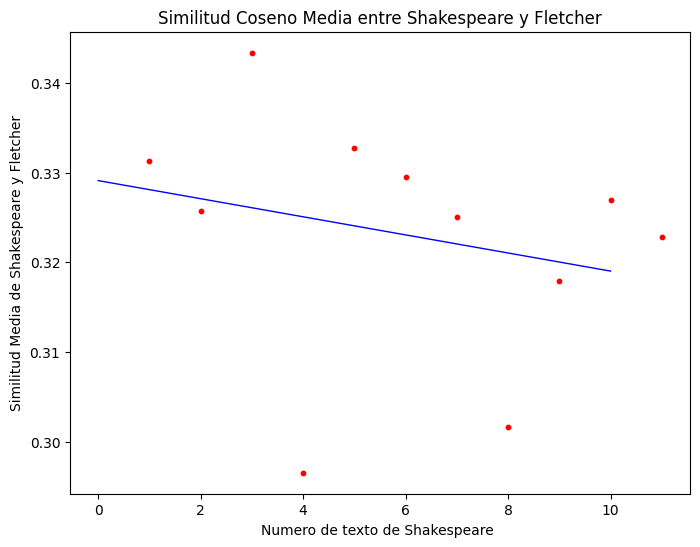

In [181]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()

text_sh  = padded_text[:10].reshape((10, 10000))
text_fh = padded_text[10:].reshape((11, 10000))
similitudes = np.zeros((11, 10))

for i in range(11):
    for j in range(10):
        #print(i,j)
        similitudes[i,j] = cosine_similarity(text_sh[j].reshape(1, -1),text_fh[i].reshape(1, -1))[0, 0]

X_range = np.array([1,2,3,4,5,6,7,8,9,10,11])
prom_sim = np.array([np.mean(similitudes[i]) for i in range(11)])
modelo.fit(X_range.reshape(-1, 1), prom_sim.reshape(-1, 1))
# Obtiene los coeficientes de la recta de regresión
pendiente = modelo.coef_[0][0]
intercepto = modelo.intercept_[0]
# Define los puntos para graficar la recta de regresión
x_linea = np.array([0, 10])
y_linea = pendiente * x_linea + intercepto


# Crear un gráfico de dispersión (scatter plot)
plt.figure(figsize=(8, 6))
plt.scatter(X_range, prom_sim, s=10, color='red', label='Similitud Media')
# Grafica la recta de regresión
plt.plot(x_linea, y_linea, color='blue', linewidth=1, label='Recta de Regresión')
plt.xlabel('Numero de texto de Shakespeare ')
plt.ylabel('Similitud Media de Shakespeare y Fletcher')
plt.title('Similitud Coseno Media entre Shakespeare y Fletcher')
plt.show()

In [64]:
#Para obtener el vector de cada texto, deben cambiar el primer indice
#vector_de_texto_i = data[i][0][0]
d = data[0][0][0] #Este es el vector de THE TRAGEDY OF HAMLET, PRINCE OF DENMARK


# Funcion de Informacion Mutua en los textos  


Para aplicar la FIM utilizamos diferentes tamaños de ventanas para las oraciones, i.e. la longitud de la oracion
(cantidad de palabras )en las que se extrairian sus valores de la FIM.

In [113]:
from sklearn.metrics import mutual_info_score
info_mutua_100 = [[mutual_info_score(data[j][0][0][i:100+i], data[j][0][0][i+1:100+(i+1)]) for i in range(3800)]for j in range(21)]
info_mutua_100 = np.array(info_mutua_100)
info_mutua_200 = [[mutual_info_score(data[j][0][0][i:200+i], data[j][0][0][i+1:200+(i+1)]) for i in range(3800)]for j in range(21)]
info_mutua_200 = np.array(info_mutua_200)
info_mutua_400 = [[mutual_info_score(data[j][0][0][i:400+i], data[j][0][0][i+1:400+(i+1)]) for i in range(3500)]for j in range(21)]
info_mutua_400 = np.array(info_mutua_400)
info_mutua_1000 = [[mutual_info_score(data[j][0][0][i:1000+i], data[j][0][0][i+1:1000+(i+1)]) for i in range(3000)]for j in range(21)]
info_mutua_1000 = np.array(info_mutua_1000)

## FIM de las Obras de Shakespeare

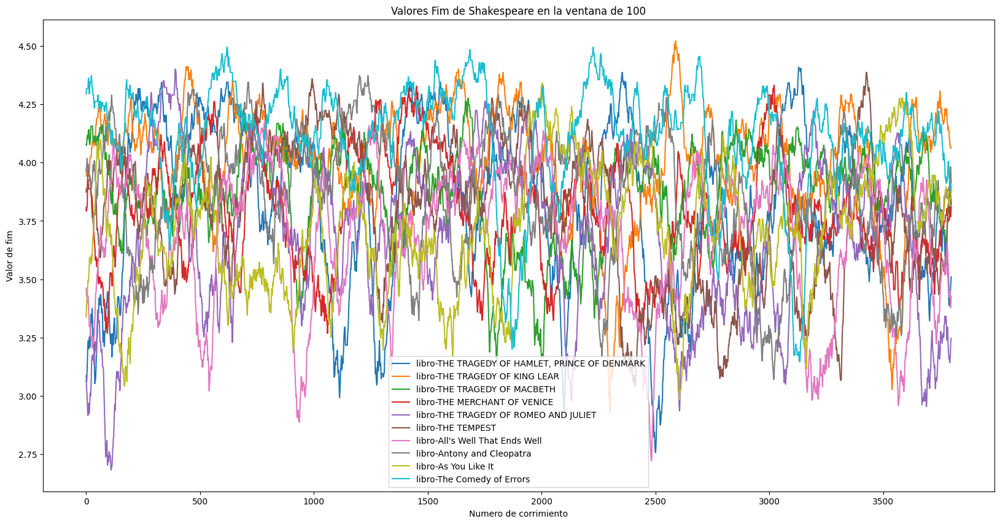

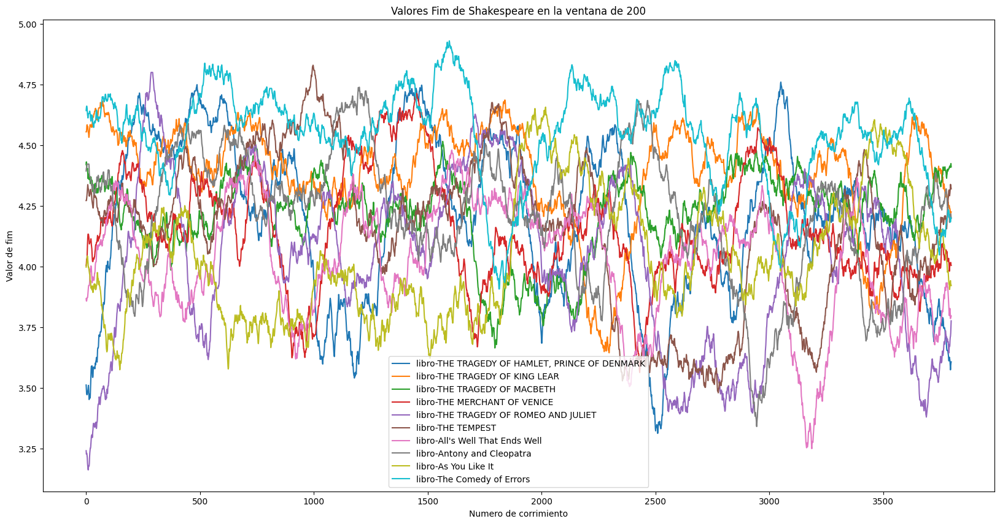

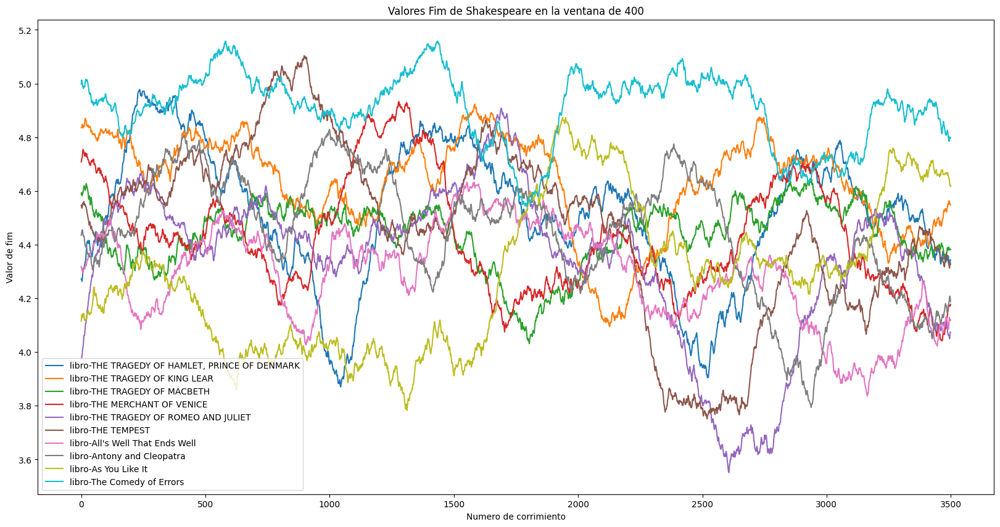

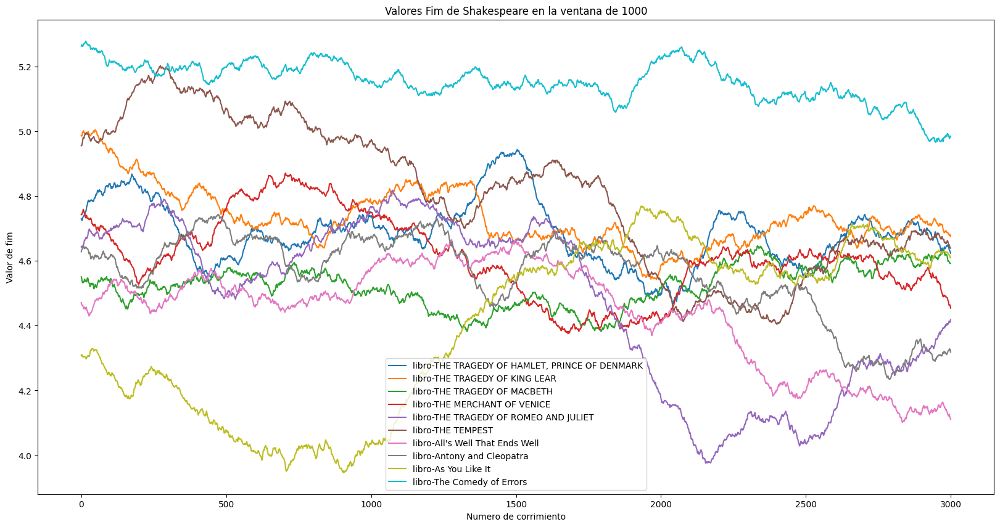

In [140]:
plt.figure(figsize=(20, 10))
for i in range(10):
  plt.plot(info_mutua_100[i], label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Shakespeare en la ventana de 100')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(10):
  plt.plot(info_mutua_200[i] ,label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Shakespeare en la ventana de 200')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(10):
  plt.plot(info_mutua_400[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Shakespeare en la ventana de 400')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(10):
  plt.plot(info_mutua_1000[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Shakespeare en la ventana de 1000')
plt.legend()
plt.show()

## FIM de las Obras de Fletcher

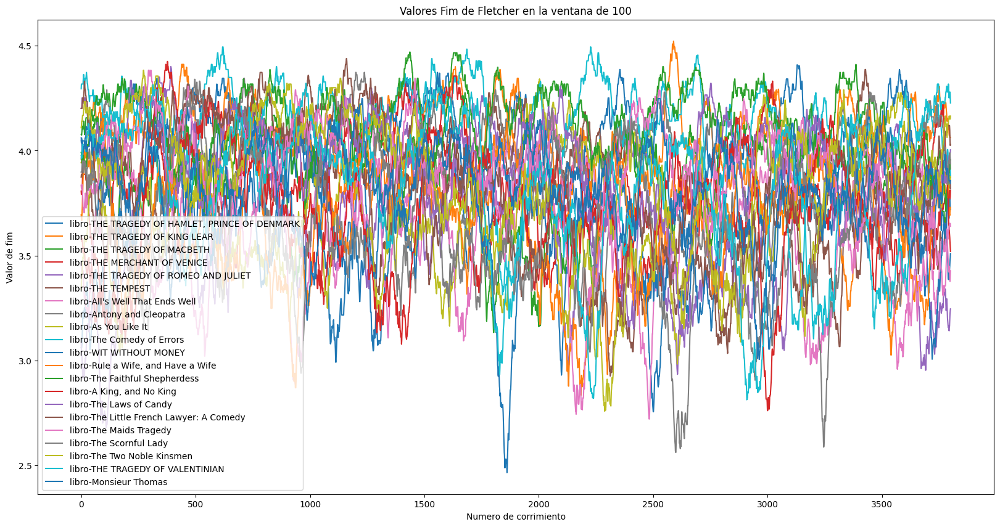

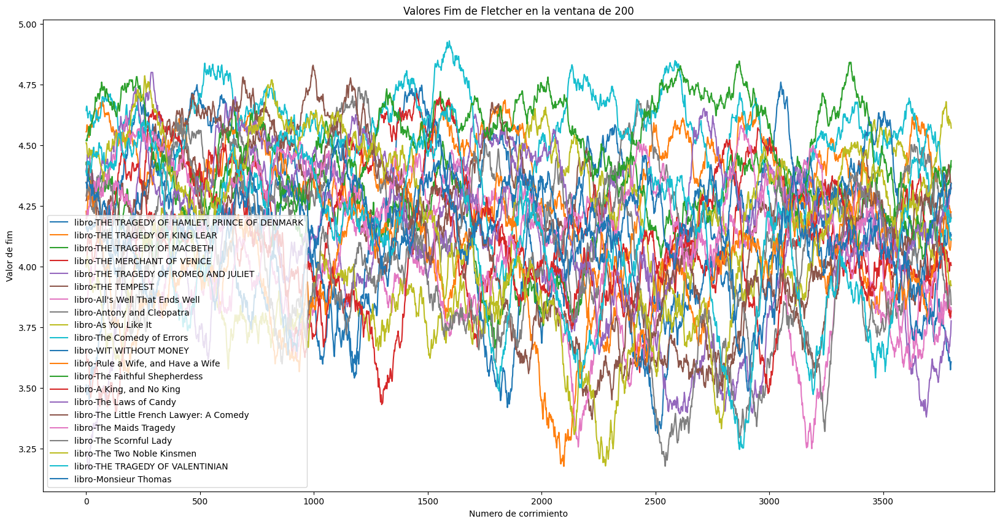

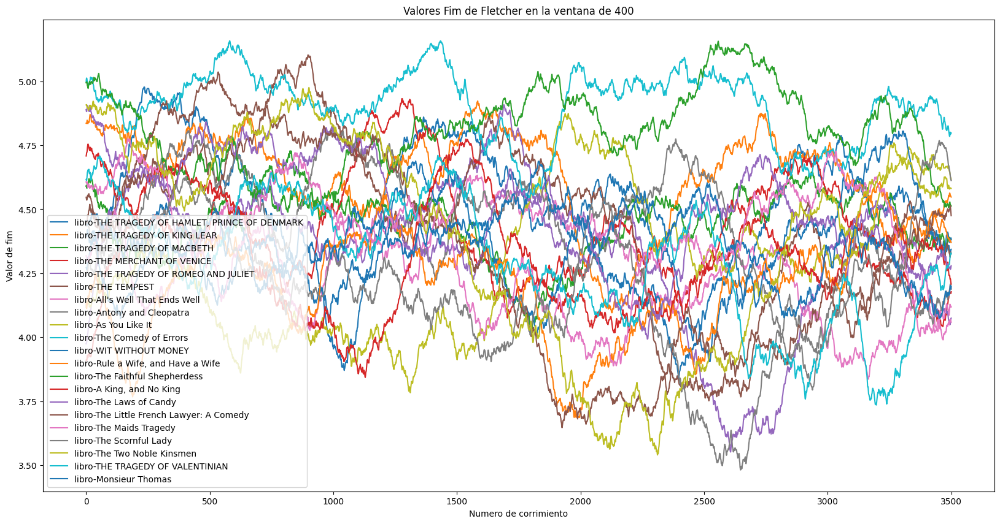

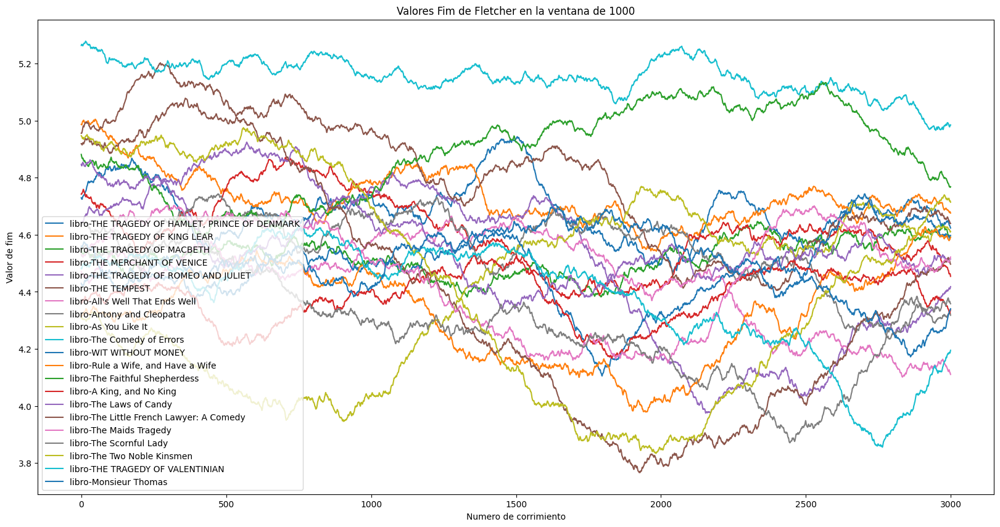

In [141]:
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_100[i], label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Fletcher en la ventana de 100')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_200[i] ,label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Fletcher en la ventana de 200')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_400[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Fletcher en la ventana de 400')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_1000[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de Fletcher en la ventana de 1000')
plt.legend()
plt.show()

## FIM de las Obras en conjunto

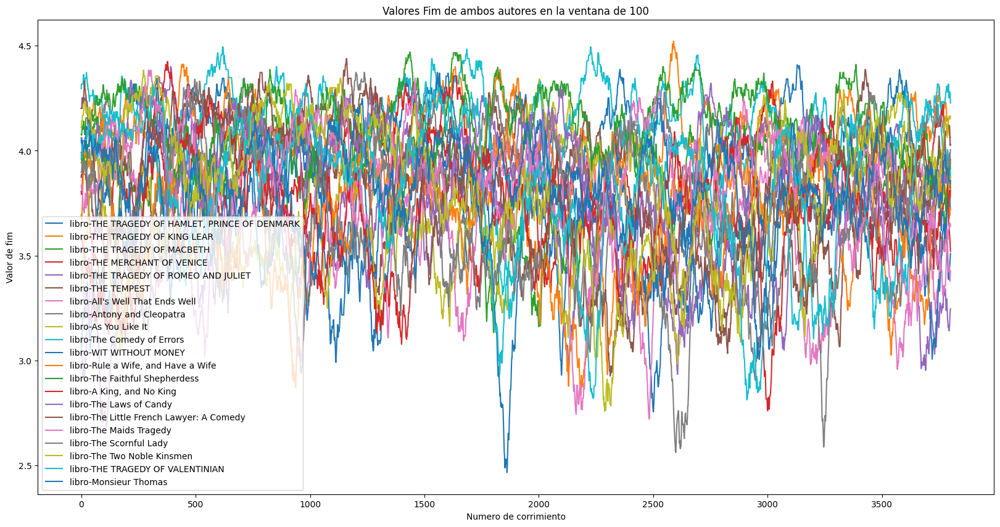

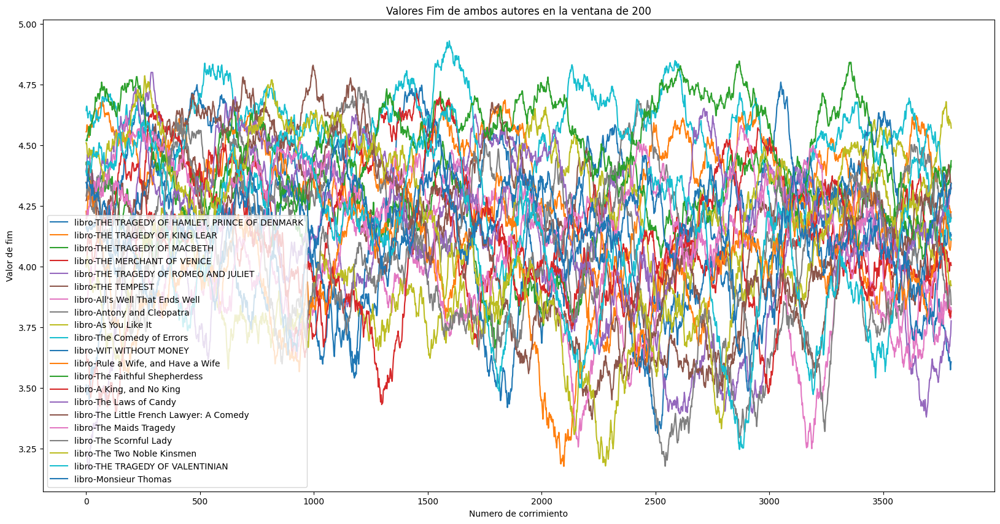

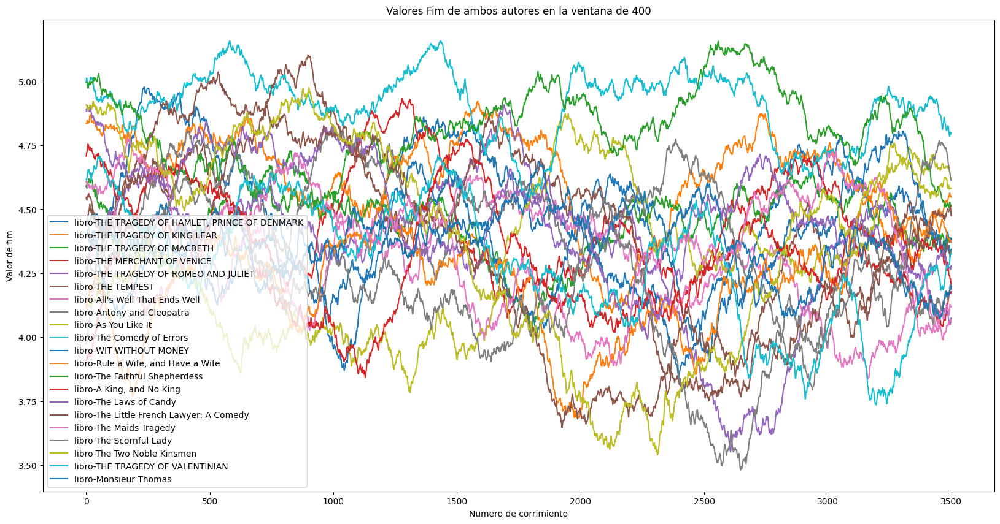

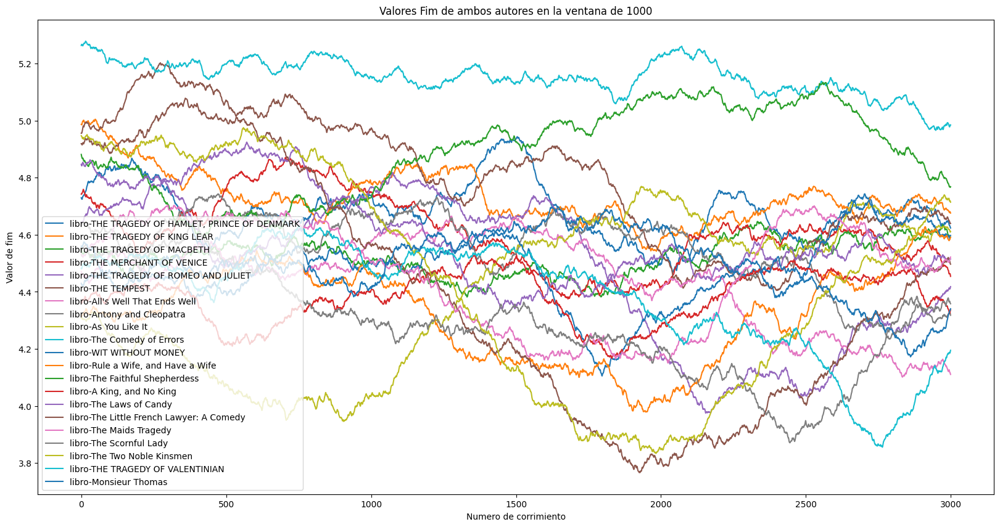

In [142]:
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_100[i], label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de ambos autores en la ventana de 100')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_200[i] ,label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de ambos autores en la ventana de 200')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_400[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de ambos autores en la ventana de 400')
plt.legend()
plt.show()
plt.figure(figsize=(20, 10))
for i in range(21):
  plt.plot(info_mutua_1000[i],label=f'libro-{obras_a_descargar[i][0]}')
plt.xlabel('Numero de corrimiento')
plt.ylabel('Valor de fim')
plt.title('Valores Fim de ambos autores en la ventana de 1000')
plt.legend()
plt.show()

# Aplicacion de PCA


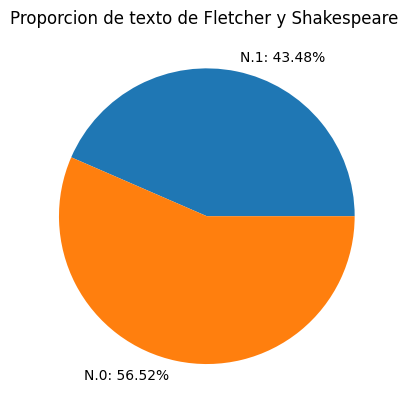

In [118]:
y = np.array(labels)
clases, cantidades = np.unique(y,return_counts=True)
cantidades_ind = np.argsort(cantidades)
total = sum(cantidades)
lab_tex = [f'N.{clases[cantidades_ind[ind]]}: {round(var*100/total,2)}% ' for ind, var in enumerate(cantidades[cantidades_ind])]
plt.pie(cantidades[cantidades_ind], labels=lab_tex)
# 1 Shakespeare
# 0 Fletcher
plt.title('Proporcion de texto de Fletcher y Shakespeare ')
plt.show()

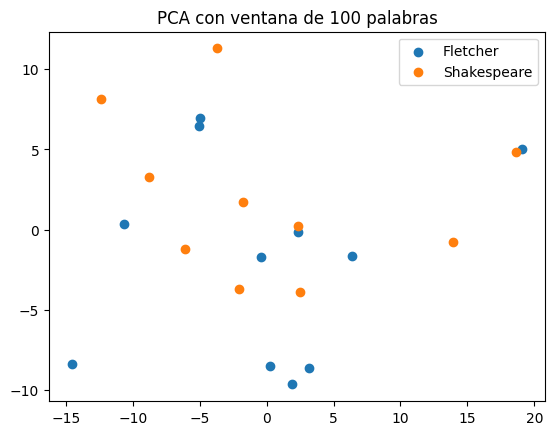

In [148]:
from sklearn.decomposition import PCA
X = info_mutua_100
y = np.array(labels)
#Modelo PCA a de 2 componentes
pca_model = PCA(n_components=2)
#Entrenamiento de los modelos de reducción dimensiomal
X_pca = pca_model.fit_transform(X)

autor = [0,1]
for i in autor :
  plt.scatter(X_pca[y==i,0],X_pca[y==i,1], label=f'Shakespeare' if i == 1 else 'Fletcher')
#Legends
plt.title('PCA con ventana de 100 palabras')
plt.legend()
plt.show()

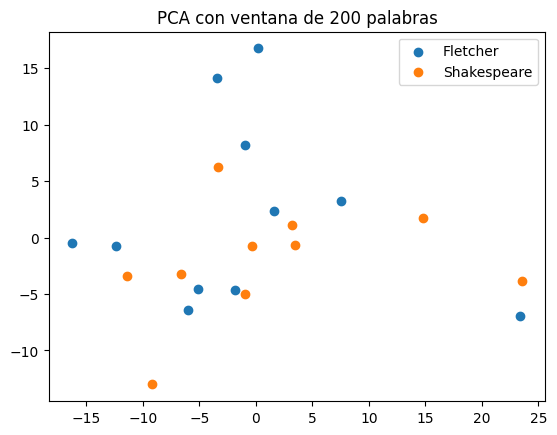

In [149]:
X = info_mutua_200
y = np.array(labels)
#Modelo PCA a de 2 componentes
pca_model = PCA(n_components=2)
#Entrenamiento de los modelos de reducción dimensiomal
X_pca = pca_model.fit_transform(X)
#X_pca_test = pca_model.fit_transform(X_test)

autor = [0,1]
for i in autor :
  plt.scatter(X_pca[y==i,0],X_pca[y==i,1], label=f'Shakespeare' if i == 1 else 'Fletcher')
#Legends
plt.title('PCA con ventana de 200 palabras')
plt.legend()
plt.show()

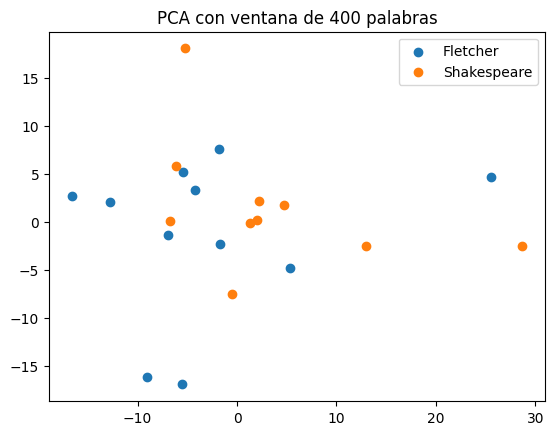

In [150]:
X = info_mutua_400
y = np.array(labels)
#Modelo PCA a de 2 componentes
pca_model = PCA(n_components=2)
#Entrenamiento de los modelos de reducción dimensiomal
X_pca = pca_model.fit_transform(X)
#X_pca_test = pca_model.fit_transform(X_test)

autor = [0,1]
for i in autor :
  plt.scatter(X_pca[y==i,0],X_pca[y==i,1], label=f'Shakespeare' if i == 1 else 'Fletcher')
#Legends
plt.title('PCA con ventana de 400 palabras')
plt.legend()
plt.show()

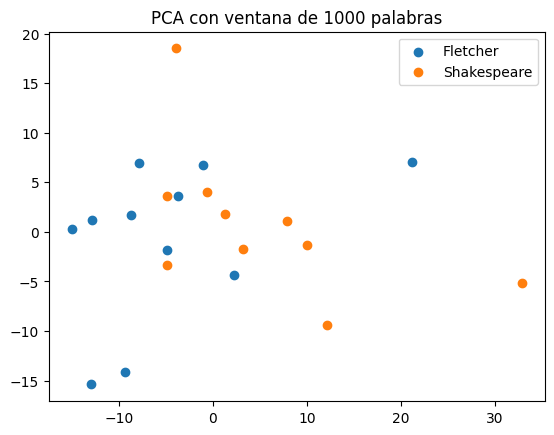

In [151]:
X = info_mutua_1000
y = np.array(labels)
#Modelo PCA a de 2 componentes
pca_model = PCA(n_components=2)
#Entrenamiento de los modelos de reducción dimensiomal
X_pca = pca_model.fit_transform(X)
#X_pca_test = pca_model.fit_transform(X_test)

autor = [0,1]
for i in autor :
  plt.scatter(X_pca[y==i,0],X_pca[y==i,1], label=f'Shakespeare' if i == 1 else 'Fletcher')
#Legends
plt.title('PCA con ventana de 1000 palabras')
plt.legend()
plt.show()